# Graph-based Audio Feature Visualisation

Instead of just exploring them by plotting (see `proj_explorer.ipynb`) which wasn't very informative any more, let's look at UMAP on these features (which recall are designed for interpretability by Qwen LM).

`umap-learn` is installed in the environment and we have Xavier Bresson's example (included in this repo from [here](https://github.com/xbresson/GML2023/blob/main/codes%2F06_Visualization%2Fcode07.ipynb)).

In [7]:
from pathlib import Path

mp3_dir = Path.cwd().parent / "data"
sep_dir = mp3_dir / "split"
embs_dir = mp3_dir / "embs"
figs_dir = mp3_dir / "figs"
figs_dir.mkdir(exist_ok=True)
assert embs_dir.exists()

In [8]:
import numpy as np
import scipy.io
from matplotlib import pyplot
import matplotlib.pyplot as plt
import time
import torch
import torchvision
import torchvision.transforms as transforms

import sys; sys.path.insert(0, 'xb_lib/')
import scipy.sparse.linalg
# import scipy.ndimage
from xb_lib.utils import construct_knn_graph, nldr_visualization
import warnings; warnings.filterwarnings("ignore")
import umap
import numpy as np
import os.path

In [3]:
import os
from pathlib import Path
import re

def parse_time(filename):
    # Extract the base name without the "_separated_accompaniment" or "_separated_vocals" suffix
    base_name = re.sub(r"(_from-\d+s|_\d+m\d+s|_\d+(ms|s)-clip)?(_separated_(accompaniment|vocals))?$", "", filename)

    # Determine the type of separation (accompaniment or vocals)
    if filename.endswith("_separated_accompaniment"):
        separation_type = 0  # Accompaniment comes first
    elif filename.endswith("_separated_vocals"):
        separation_type = 1  # Vocals come second
    else:
        separation_type = -1  # No separation suffix

    # Extract time for sorting within the group
    match = re.search(r"(?:(\d+)m)?(?:(\d+)(ms|s))", filename)
    if match:
        minutes, value, unit = match.groups()
        minutes = int(minutes) if minutes else 0  # Convert minutes to integer or default to 0
        value = int(value)
        # Convert minutes and seconds to milliseconds for uniformity
        total_time = minutes * 60 * 1000  # Convert minutes to milliseconds
        if unit == "s":
            total_time += value * 1000  # Convert seconds to milliseconds
        elif unit == "ms":
            total_time += value  # Milliseconds are added as-is
    else:
        total_time = 0  # Treat files with no time info as starting at 0s

    # Return a tuple for sorting: base name, time, and separation type
    return (base_name, total_time, separation_type)

# UMAP for music tracks embedded with Qwen v2 Audio multimodal projector features

In [4]:
output_file = embs_dir / "all_proj_features.pt"

def load_and_process_embeddings(embs_dir):
    """
    Load embeddings from .pt files, extract the 'projected_outputs' key,
    and concatenate rows into a single feature vector for each file.
    """
    all_features = []
    start = time.time()
    
    # Iterate over sorted .pt files
    for emb in sorted(embs_dir.iterdir(), key=lambda x: parse_time(x.stem)):
        if emb.suffix == ".pt" and "separated" in emb.stem:
            print(f"Processing: {emb.stem}")
            emb_pt = torch.load(emb)
            
            # Extract 'projected_outputs' key and reshape
            features = emb_pt["projected_outputs"].squeeze(0)
            all_features.append(features)
            
            print(f"Extracted features: {features.shape} from {emb.stem}")

    # Concatenate all features into a single tensor
    all_features = torch.cat(all_features, dim=0)
    print(f"Total concatenated features shape: {all_features.shape}")
    print(f"Processing completed in {(time.time() - start) / 60:.2f} minutes.")
    return all_features

features = load_and_process_embeddings(embs_dir)
torch.save(features, output_file)
print(f"Concatenated features saved to: {output_file}")

Processing: donatachi-2pop-reup-16m50s-sweat-drop_separated_accompaniment
Extracted features: torch.Size([750, 4096]) from donatachi-2pop-reup-16m50s-sweat-drop_separated_accompaniment
Processing: donatachi-2pop-reup-16m50s-sweat-drop_separated_vocals
Extracted features: torch.Size([750, 4096]) from donatachi-2pop-reup-16m50s-sweat-drop_separated_vocals
Processing: glacci-nest-10m-turns-to-love_separated_accompaniment
Extracted features: torch.Size([750, 4096]) from glacci-nest-10m-turns-to-love_separated_accompaniment
Processing: glacci-nest-10m-turns-to-love_separated_vocals
Extracted features: torch.Size([750, 4096]) from glacci-nest-10m-turns-to-love_separated_vocals
Processing: glacci-nest-10m-turns-to-love_10ms-clip_separated_accompaniment
Extracted features: torch.Size([750, 4096]) from glacci-nest-10m-turns-to-love_10ms-clip_separated_accompaniment
Processing: glacci-nest-10m-turns-to-love_10ms-clip_separated_vocals
Extracted features: torch.Size([750, 4096]) from glacci-nest-1

Loaded feature data of shape: (13500, 4096)
[t-SNE] Computing 46 nearest neighbors...
[t-SNE] Indexed 13500 samples in 0.012s...
[t-SNE] Computed neighbors for 13500 samples in 5.552s...
[t-SNE] Computed conditional probabilities for sample 1000 / 13500
[t-SNE] Computed conditional probabilities for sample 2000 / 13500
[t-SNE] Computed conditional probabilities for sample 3000 / 13500
[t-SNE] Computed conditional probabilities for sample 4000 / 13500
[t-SNE] Computed conditional probabilities for sample 5000 / 13500
[t-SNE] Computed conditional probabilities for sample 6000 / 13500
[t-SNE] Computed conditional probabilities for sample 7000 / 13500
[t-SNE] Computed conditional probabilities for sample 8000 / 13500
[t-SNE] Computed conditional probabilities for sample 9000 / 13500
[t-SNE] Computed conditional probabilities for sample 10000 / 13500
[t-SNE] Computed conditional probabilities for sample 11000 / 13500
[t-SNE] Computed conditional probabilities for sample 12000 / 13500
[t-SNE

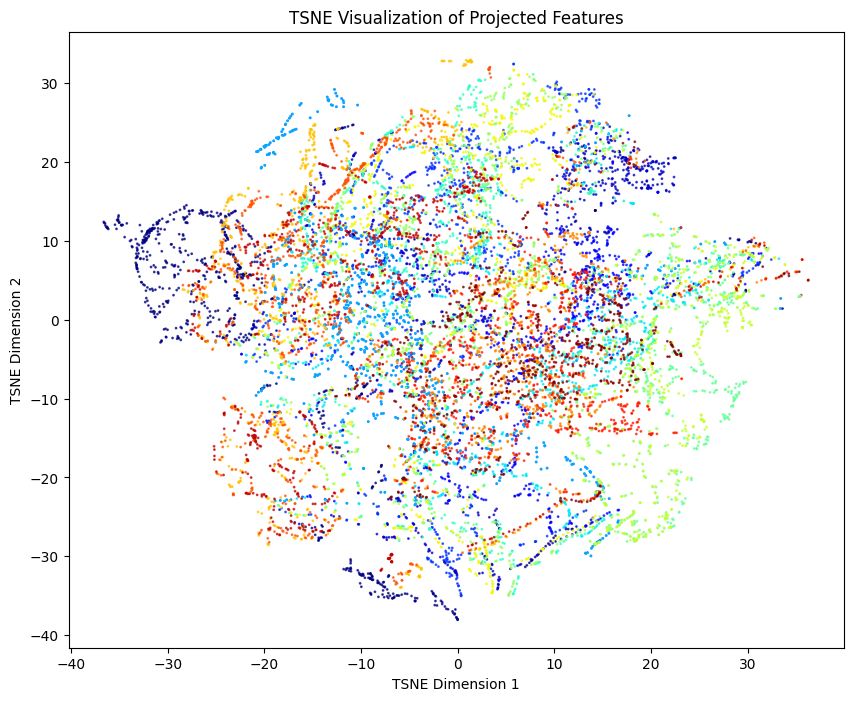

In [5]:
# TSNE Visualization
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import time

# Load the processed features
features_file = embs_dir / "all_proj_features.pt"
features = torch.load(features_file)

num_files = features.size(0) // 750  # As each file contributes 750 rows
C = np.repeat(np.arange(num_files), 750)  # Assign a unique class per source file

# Convert to numpy for TSNE
data_feat = features.numpy()  # Shape: [N, 3,072,000]

print(f"Loaded feature data of shape: {data_feat.shape}")

# TSNE parameters
start = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=15, n_iter=1000)
embedding = tsne.fit_transform(data_feat)  # TSNE works with numpy arrays
print(f"TSNE completed in {(time.time() - start):.2f} seconds")

# Split the 3D embedding
Xvis = embedding[:, 0]
Yvis = embedding[:, 1]
Zvis = embedding[:, 2]

# 2D Visualization
plt.figure(figsize=(10, 8))
plt.scatter(Xvis, Yvis, c=C, cmap="jet", s=1, alpha=0.7)
plt.title("TSNE Visualization of Projected Features")
plt.xlabel("TSNE Dimension 1")
plt.ylabel("TSNE Dimension 2")
plt.show()

Not good! But recall that some are actually the same file so you'd expect overlap. It also doesn't look so bad in 3D:

In [6]:
# 3D Visualization
import plotly.graph_objects as go
data = go.Scatter3d(x=Xvis, y=Yvis, z=Zvis, mode='markers', marker=dict(size=1, color=C, colorscale='jet', opacity=1)) # data as points
# data = go.Scatter3d(x=Xvis, y=Yvis, z=Zvis, mode='markers', marker=dict(size=1, color=C, colorscale='jet', opacity=1, showscale=True)) # w/ colobar 
fig = go.Figure(data=[data]) 
fig.update_layout(margin=dict(l=0, r=0, b=0, t=25, pad=0)) # tight layout but t=25 required for showing title 
fig.update_layout(autosize=False, width=800, height=800, title_text="Music tracks' Qwen v2 Audio encoder projected features TSNE coloured by source file") # figure size and title
# fig.update_layout(scene = dict(xaxis = dict(visible=False), yaxis = dict(visible=False), zaxis = dict(visible=False))) # no grid, no axis 
# fig.update_layout(scene = dict(xaxis_title = ' ', yaxis_title = ' ', zaxis_title = ' ')) # no axis name 
fig.update_layout(scene = dict(zaxis = dict(showgrid = True, showticklabels = False), zaxis_title = ' ') ) # no range values, no axis name, grid on
fig.update_layout(scene = dict(yaxis = dict(showgrid = True, showticklabels = False), yaxis_title = ' ') ) # no range values, no axis name, grid on
fig.update_layout(scene = dict(xaxis = dict(showgrid = True, showticklabels = False), xaxis_title = ' ') ) # no range values, no axis name, grid on
fig.show()


## Visualise with UMAP

UMAP(n_components=3, verbose=True)
Mon Dec 23 18:23:35 2024 Construct fuzzy simplicial set
Mon Dec 23 18:23:35 2024 Finding Nearest Neighbors
Mon Dec 23 18:23:35 2024 Building RP forest with 11 trees
Mon Dec 23 18:23:38 2024 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Mon Dec 23 18:23:46 2024 Finished Nearest Neighbor Search
Mon Dec 23 18:23:47 2024 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Mon Dec 23 18:23:49 2024 Finished embedding
time(sec): 14.494673252105713
(13500, 3)


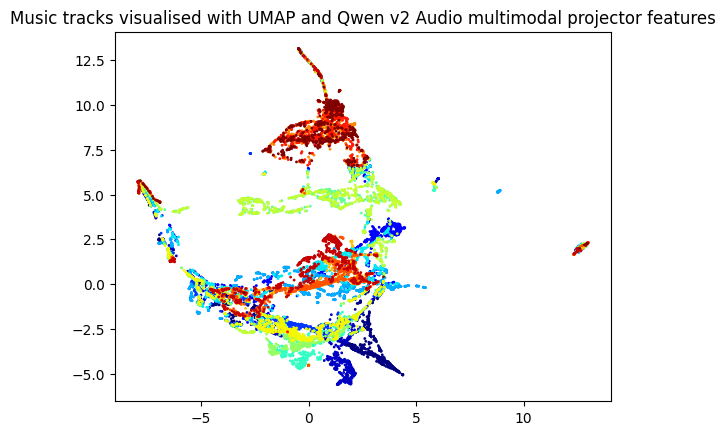

In [7]:
start = time.time()
reducer = umap.UMAP(n_components=3, verbose=True)
#reducer = umap.UMAP(n_components=2, verbose=True)
embedding = reducer.fit_transform(data_feat)
print('time(sec):',(time.time()-start)/1)

print(embedding.shape)
Xvis = embedding[:,0]
Yvis = embedding[:,1]
Zvis = embedding[:,2]

# 2D Visualization
plt.figure(3)
plt.scatter(Xvis, Yvis, c=C, s=1, color=pyplot.jet())
plt.title('Music tracks visualised with UMAP and Qwen v2 Audio multimodal projector features') 
plt.show()


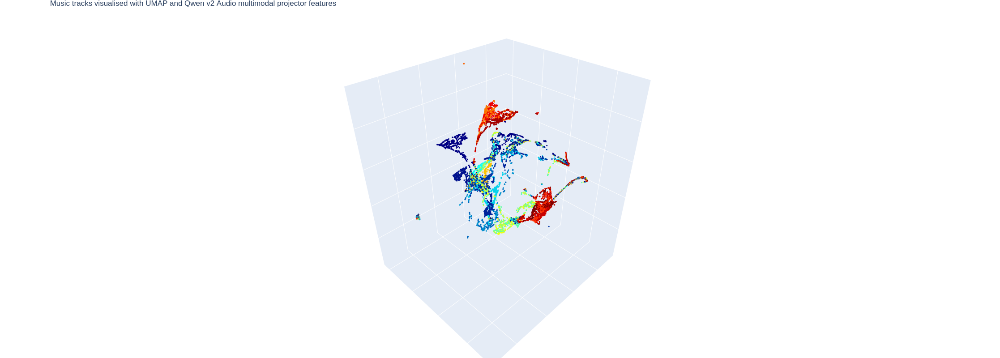

In [8]:
# 3D Visualization
import plotly.graph_objects as go
data = go.Scatter3d(x=Xvis, y=Yvis, z=Zvis, mode='markers', marker=dict(size=1, color=C, colorscale='jet', opacity=1)) # data as points
# data = go.Scatter3d(x=Xvis, y=Yvis, z=Zvis, mode='markers', marker=dict(size=1, color=C, colorscale='jet', opacity=1, showscale=True)) # w/ colobar 
fig = go.Figure(data=[data]) 
fig.update_layout(margin=dict(l=0, r=0, b=0, t=25, pad=0)) # tight layout but t=25 required for showing title 
fig.update_layout(autosize=False, width=800, height=800, title_text="Music tracks visualised with UMAP and Qwen v2 Audio multimodal projector features") # figure size and title
# fig.update_layout(scene = dict(xaxis = dict(visible=False), yaxis = dict(visible=False), zaxis = dict(visible=False))) # no grid, no axis 
# fig.update_layout(scene = dict(xaxis_title = ' ', yaxis_title = ' ', zaxis_title = ' ')) # no axis name 
fig.update_layout(scene = dict(zaxis = dict(showgrid = True, showticklabels = False), zaxis_title = ' ') ) # no range values, no axis name, grid on
fig.update_layout(scene = dict(yaxis = dict(showgrid = True, showticklabels = False), yaxis_title = ' ') ) # no range values, no axis name, grid on
fig.update_layout(scene = dict(xaxis = dict(showgrid = True, showticklabels = False), xaxis_title = ' ') ) # no range values, no axis name, grid on
fig.show()


## Text Embedding Visualisation Vs. Audio Embeddings

A good idea was suggested [on X](https://x.com/andimarafioti/status/1871319717732028561)

In [10]:
import torch
from transformers import AutoProcessor, Qwen2AudioForConditionalGeneration

full_model = Qwen2AudioForConditionalGeneration.from_pretrained("Qwen/Qwen2-Audio-7B")
processor = AutoProcessor.from_pretrained("Qwen/Qwen2-Audio-7B", trust_remote_code=True)

Loading checkpoint shards:   0%|          | 0/5 [00:00<?, ?it/s]

In [11]:
vocab_size = processor.tokenizer.vocab_size
print(vocab_size)

151643


In [12]:
token_embedding = full_model.language_model.model.embed_tokens
token_indices = torch.arange(0, vocab_size - 1)
with torch.no_grad():
    tok_emb = token_embedding(token_indices)

print(tok_emb.shape)
print(tok_emb)

torch.Size([151642, 4096])
tensor([[-0.0170, -0.0076,  0.0023,  ...,  0.0073,  0.0069,  0.0075],
        [-0.0055,  0.0036, -0.0143,  ...,  0.0079, -0.0021,  0.0023],
        [ 0.0063, -0.0096, -0.0117,  ...,  0.0197,  0.0132, -0.0068],
        ...,
        [-0.0005, -0.0004,  0.0014,  ..., -0.0015, -0.0006,  0.0007],
        [-0.0025, -0.0029,  0.0041,  ..., -0.0027,  0.0004, -0.0098],
        [-0.0006, -0.0029,  0.0008,  ..., -0.0007,  0.0072, -0.0020]])


Combined feature shape: torch.Size([27286, 4096])
Combined labels shape: (27286,)
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 27286 samples in 0.025s...
[t-SNE] Computed neighbors for 27286 samples in 19.077s...
[t-SNE] Computed conditional probabilities for sample 1000 / 27286
[t-SNE] Computed conditional probabilities for sample 2000 / 27286
[t-SNE] Computed conditional probabilities for sample 3000 / 27286
[t-SNE] Computed conditional probabilities for sample 4000 / 27286
[t-SNE] Computed conditional probabilities for sample 5000 / 27286
[t-SNE] Computed conditional probabilities for sample 6000 / 27286
[t-SNE] Computed conditional probabilities for sample 7000 / 27286
[t-SNE] Computed conditional probabilities for sample 8000 / 27286
[t-SNE] Computed conditional probabilities for sample 9000 / 27286
[t-SNE] Computed conditional probabilities for sample 10000 / 27286
[t-SNE] Computed conditional probabilities for sample 11000 / 27286
[t-SNE] Computed conditional probab

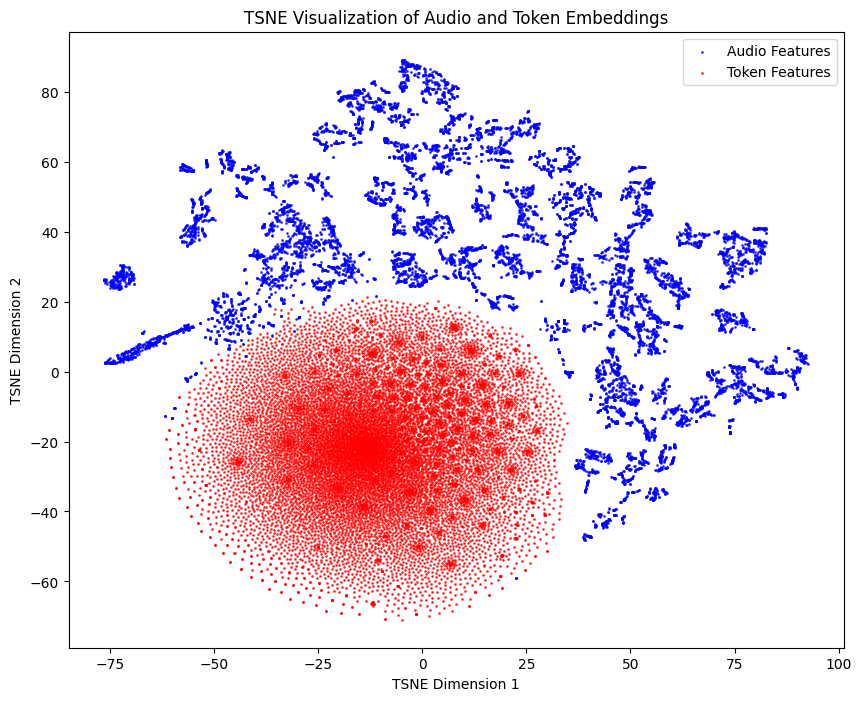

In [13]:
# TSNE Visualization with Two Classes
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import torch
import numpy as np
import time

# Load the processed audio features (old embeddings)
features_file = embs_dir / "all_proj_features.pt"
audio_features = torch.load(features_file)

# Group all audio embeddings into one class
num_audio_samples = audio_features.size(0)
audio_labels = np.zeros(num_audio_samples)  # Class 0 for audio embeddings

# Load token embeddings (new embeddings)
token_embedding = full_model.language_model.model.embed_tokens
n_tok_samples = num_audio_samples # Use the same amount of each (too many makes it too slow to tSNE)
token_indices = torch.arange(0, vocab_size - 1, vocab_size // n_tok_samples)
with torch.no_grad():
    token_features = token_embedding(token_indices)

# Group all token embeddings into a separate class
num_token_samples = token_features.size(0)
token_labels = np.ones(num_token_samples)  # Class 1 for token embeddings

# Combine the embeddings into one tensor
all_features = torch.cat([audio_features, token_features], dim=0)  # Shape: [num_audio_samples + num_token_samples, 4096]

# Combine the labels into one array
all_labels = np.concatenate([audio_labels, token_labels])  # Shape: [num_audio_samples + num_token_samples]

print(f"Combined feature shape: {all_features.shape}")
print(f"Combined labels shape: {all_labels.shape}")

# Convert to numpy for TSNE
data_feat = all_features.numpy()

# Perform TSNE
start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=1000)  # 2D visualization
embedding = tsne.fit_transform(data_feat)
print(f"TSNE completed in {(time.time() - start):.2f} seconds")

# Split the 2D embedding for visualization
Xvis = embedding[:, 0]
Yvis = embedding[:, 1]

# Visualization
plt.figure(figsize=(10, 8))
plt.scatter(Xvis[all_labels == 0], Yvis[all_labels == 0], c="blue", s=1, alpha=0.7, label="Audio Features")
plt.scatter(Xvis[all_labels == 1], Yvis[all_labels == 1], c="red", s=1, alpha=0.7, label="Token Features")
plt.title("TSNE Visualization of Audio and Token Embeddings")
plt.xlabel("TSNE Dimension 1")
plt.ylabel("TSNE Dimension 2")
plt.legend()
plt.show()


UMAP(n_components=3, verbose=True)
Mon Dec 23 23:24:36 2024 Construct fuzzy simplicial set
Mon Dec 23 23:24:36 2024 Finding Nearest Neighbors
Mon Dec 23 23:24:36 2024 Building RP forest with 13 trees
Mon Dec 23 23:24:44 2024 NN descent for 15 iterations
	 1  /  15
	 2  /  15
	 3  /  15
	 4  /  15
	 5  /  15
	 6  /  15
	 7  /  15
	 8  /  15
	 9  /  15
	 10  /  15
	Stopping threshold met -- exiting after 10 iterations
Mon Dec 23 23:24:52 2024 Finished Nearest Neighbor Search
Mon Dec 23 23:24:54 2024 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Mon Dec 23 23:24:58 2024 Finished embedding
time(sec): 22.669293880462646
(27286, 3)


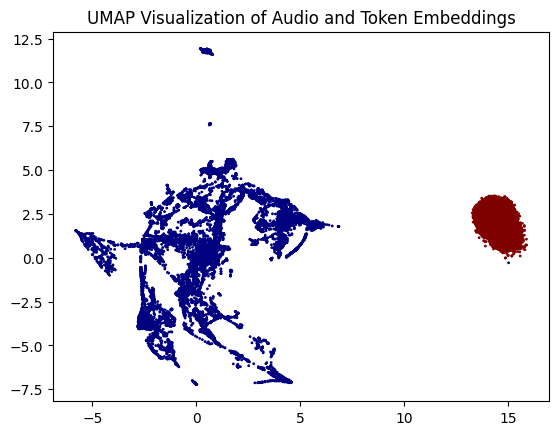

In [14]:
start = time.time()
reducer = umap.UMAP(n_components=3, verbose=True)
#reducer = umap.UMAP(n_components=2, verbose=True)
embedding = reducer.fit_transform(data_feat)
print('time(sec):',(time.time()-start)/1)

print(embedding.shape)
Xvis = embedding[:,0]
Yvis = embedding[:,1]
Zvis = embedding[:,2]

# 2D Visualization
plt.figure(3)
plt.scatter(Xvis, Yvis, c=all_labels, s=1, color=pyplot.jet())
plt.title('UMAP Visualization of Audio and Token Embeddings') 
plt.show()

Indeed there is a very clear separation here between audio embeddings and the text token embedding (unfortunately there's not much within the audio features), as was reported in VLMs too. This makes sense as spectrograms are being used to treat audio like images essentially.